##**Loading Data from kaggle**

In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [2]:
!kaggle datasets download -d yapwh1208/dogs-breed-dataset

Dataset URL: https://www.kaggle.com/datasets/yapwh1208/dogs-breed-dataset
License(s): CC-BY-NC-SA-4.0
 99% 625M/629M [00:06<00:00, 93.5MB/s]
100% 629M/629M [00:06<00:00, 99.8MB/s]


In [3]:
import zipfile
zip = zipfile.ZipFile("/content/dogs-breed-dataset.zip",'r')
zip.extractall("/content")
zip.close()

In [4]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,BatchNormalization,Dropout
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import pathlib
%matplotlib inline

In [5]:
data = '/content/dog_v1'
data = pathlib.Path(data)

### **Data Visualization**

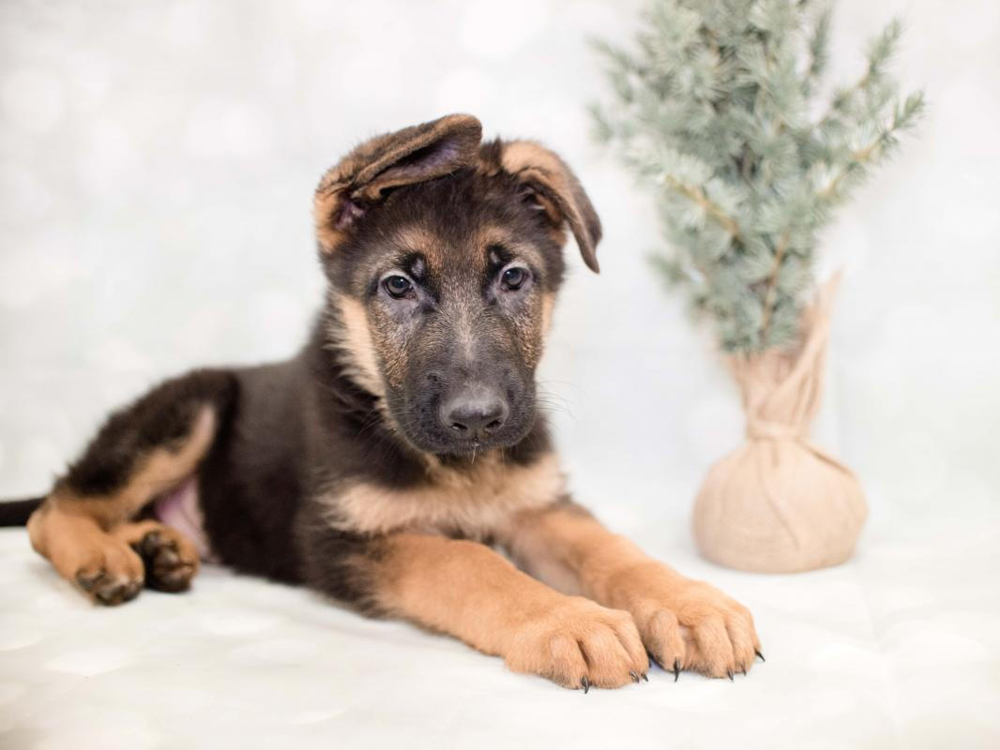

In [6]:
gs = list(data.glob('german_shepherd/*'))
PIL.Image.open(str(gs[0]))

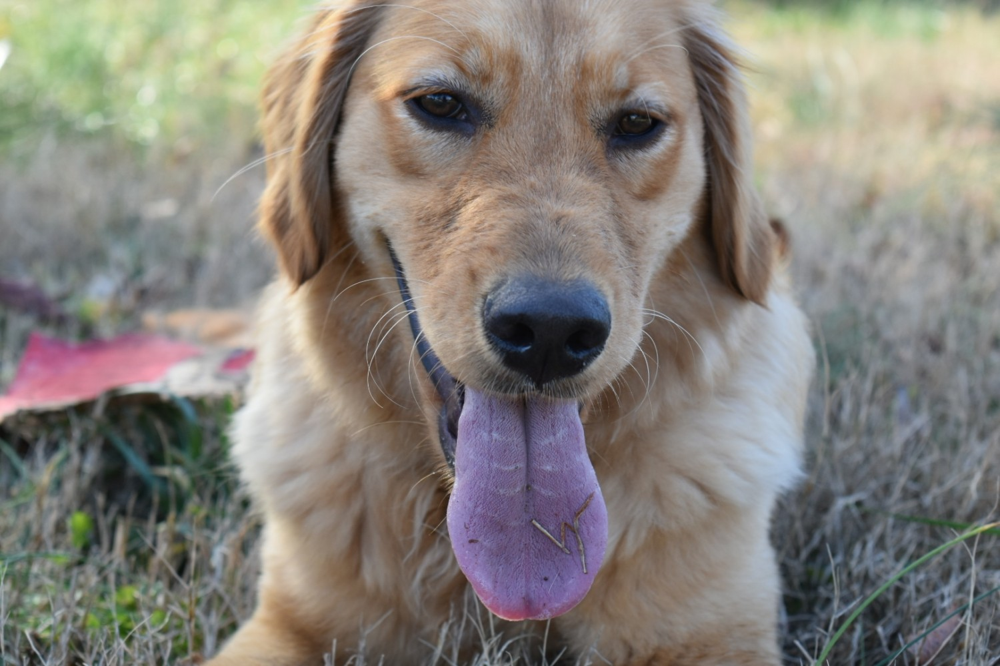

In [7]:
gr = list(data.glob('golden_retriever/*'))
PIL.Image.open(str(gr[0]))

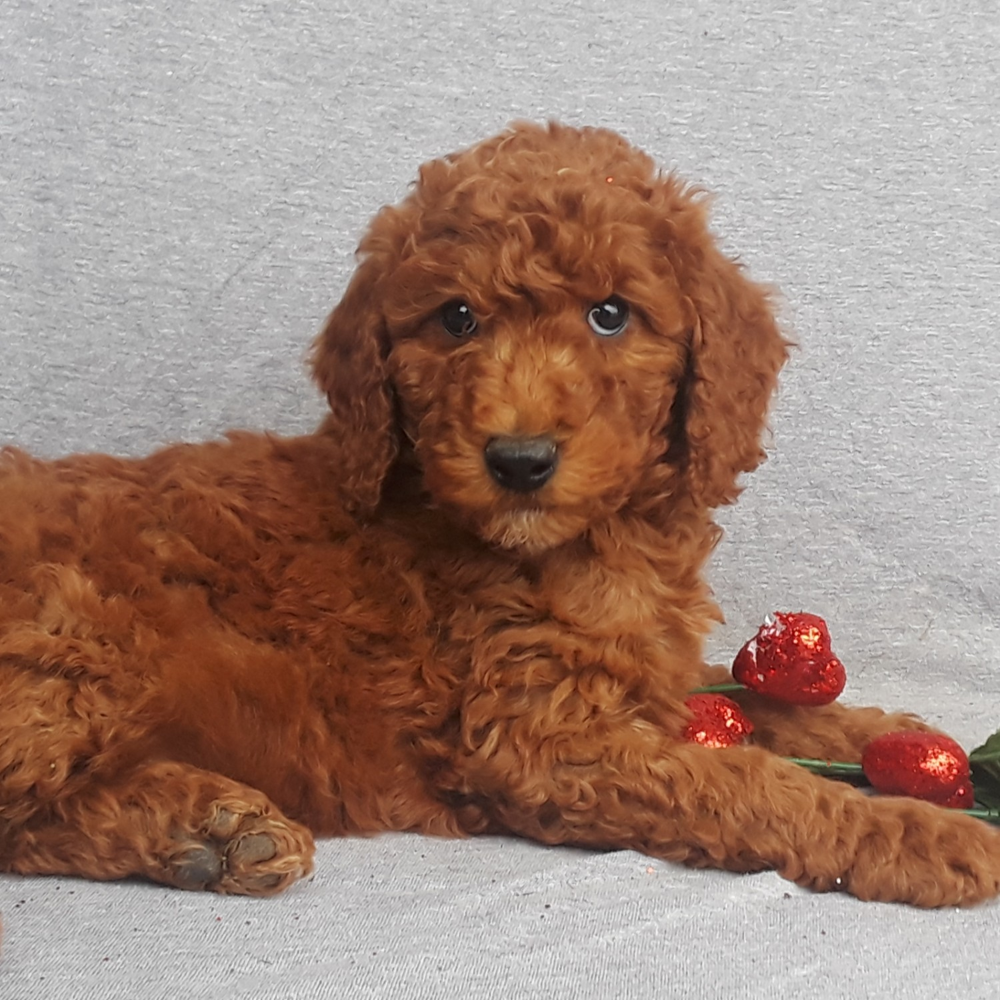

In [8]:
pd = list(data.glob('poodle/*'))
PIL.Image.open(str(pd[0]))

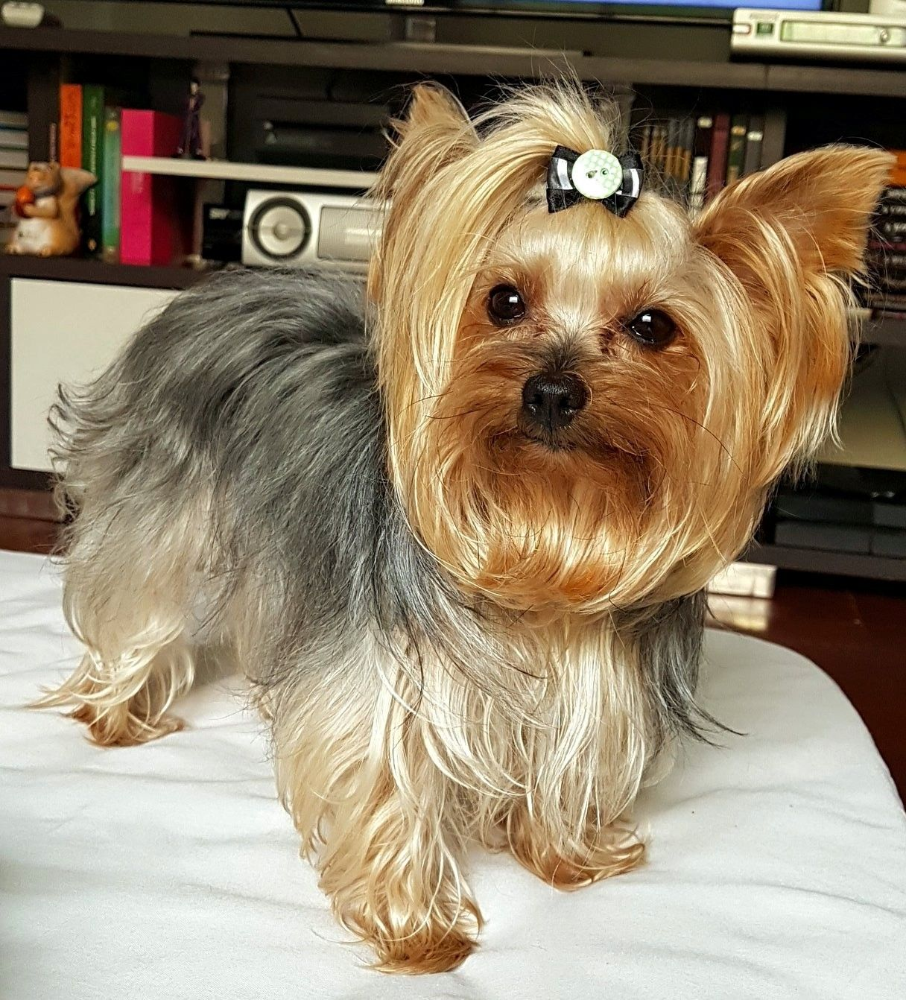

In [9]:
yt = list(data.glob('yorkshire_terrier/*'))
PIL.Image.open(str(yt[0]))

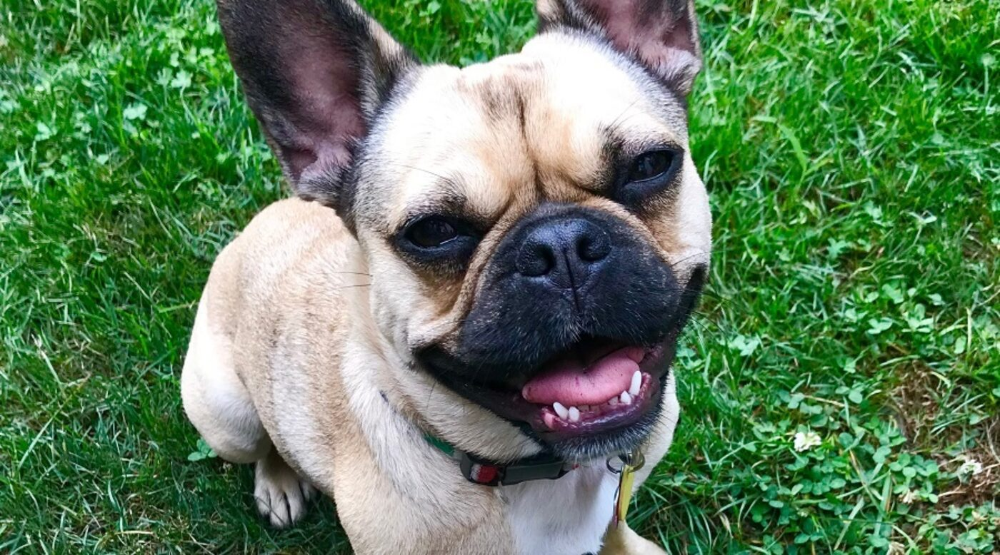

In [10]:
fb = list(data.glob('french_bulldog/*'))
PIL.Image.open(str(fb[0]))

### **Data Augmentation and preprocessing**

In [11]:
batch_size = 32
img_height = 180
img_width = 180

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [13]:
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

validation_datagen = ImageDataGenerator(rescale=1.0/255, validation_split=0.2)


In [14]:
train_generator = train_datagen.flow_from_directory(
    directory=data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    subset='training',  # Set as training data
    seed=123
)

validation_generator = validation_datagen.flow_from_directory(
    directory=data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    subset='validation',  # Set as validation data
    seed=123
)


Found 826 images belonging to 5 classes.
Found 204 images belonging to 5 classes.


In [15]:
class_names = list(train_generator.class_indices.keys())
print(class_names)

['french_bulldog', 'german_shepherd', 'golden_retriever', 'poodle', 'yorkshire_terrier']


### **Importing pre-defined model and using Transfer Learning**

In [16]:
from keras.applications.vgg16 import VGG16

In [17]:
conv_base = VGG16(
    weights='imagenet',
    include_top = False,
    input_shape=(180,180,3)
)

58889256/58889256 [==============================] - 1s 0us/step


In [18]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [19]:
model = Sequential()

model.add(conv_base)
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dense(5,activation='sigmoid'))

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 12800)             0         
                                                                 
 dense (Dense)               (None, 512)               6554112   
                                                                 
 dense_1 (Dense)             (None, 5)                 2565      
                                                                 
Total params: 21271365 (81.14 MB)
Trainable params: 21271365 (81.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [21]:
conv_base.trainable = False

In [22]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [25]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=10
)

Epoch 1/10
25/25 [==============================] - 47s 2s/step - loss: 0.4934 - accuracy: 0.8249 - val_loss: 0.8770 - val_accuracy: 0.6979
Epoch 2/10
25/25 [==============================] - 43s 2s/step - loss: 0.4828 - accuracy: 0.8249 - val_loss: 0.6169 - val_accuracy: 0.7812
Epoch 3/10
25/25 [==============================] - 44s 2s/step - loss: 0.4861 - accuracy: 0.8224 - val_loss: 0.4882 - val_accuracy: 0.8229
Epoch 4/10
25/25 [==============================] - 50s 2s/step - loss: 0.4486 - accuracy: 0.8375 - val_loss: 0.5346 - val_accuracy: 0.8021
Epoch 5/10
25/25 [==============================] - 44s 2s/step - loss: 0.4845 - accuracy: 0.8174 - val_loss: 0.5234 - val_accuracy: 0.8177
Epoch 6/10
25/25 [==============================] - 42s 2s/step - loss: 0.4173 - accuracy: 0.8552 - val_loss: 0.5246 - val_accuracy: 0.8177
Epoch 7/10
25/25 [==============================] - 42s 2s/step - loss: 0.3984 - accuracy: 0.8627 - val_loss: 0.5938 - val_accuracy: 0.8021
Epoch 8/10
25/25 [==

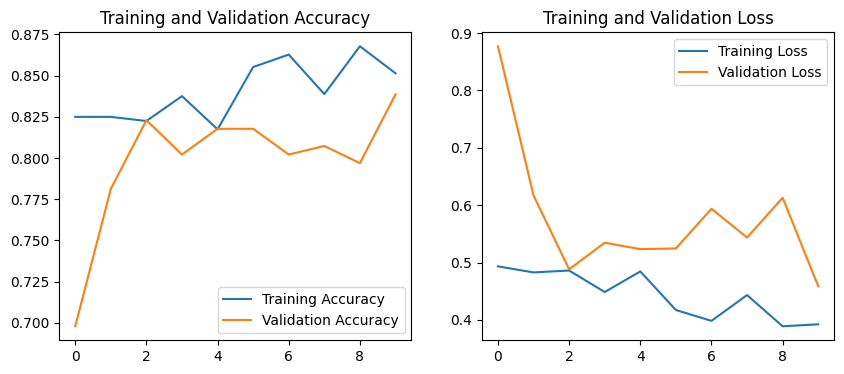

In [26]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(10)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


### **Prediction**

1/1 [==============================] - 2s 2s/step


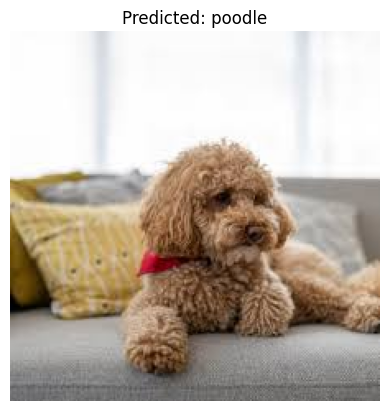

In [27]:
from tensorflow.keras.preprocessing import image
# Path to the random image
random_image_path = '/content/p_image.jpg'

# Load and preprocess the image
def load_and_preprocess_image(image_path, img_height, img_width):
    img = image.load_img(image_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Make a prediction using the model
def predict_image(model, img_array, class_names):
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_class_name = class_names[predicted_class]
    return predicted_class_name, predictions[0]

# Display the prediction results
def display_prediction(image_path, predicted_class_name):
    img = image.load_img(image_path)
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_class_name}')
    plt.axis('off')
    plt.show()

# Load and preprocess the image
img_array = load_and_preprocess_image(random_image_path, img_height, img_width)

# Predict the class of the image
predicted_class_name, _ = predict_image(model, img_array, class_names)

# Display the prediction results
display_prediction(random_image_path, predicted_class_name)


1/1 [==============================] - 0s 65ms/step


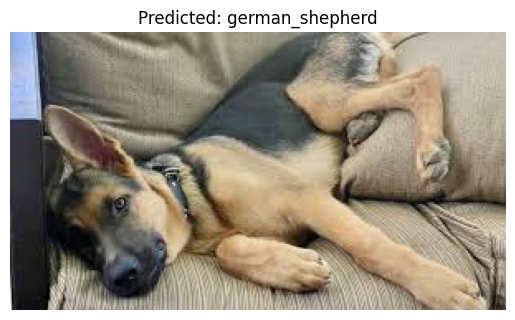

In [29]:
random_image_path_2 = '/content/gshe.jpg'
# Load and preprocess the image
img_array = load_and_preprocess_image(random_image_path_2, img_height, img_width)

# Predict the class of the image
predicted_class_name, _ = predict_image(model, img_array, class_names)

# Display the prediction results
display_prediction(random_image_path_2, predicted_class_name)

1/1 [==============================] - 0s 66ms/step


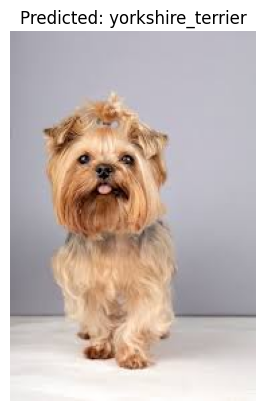

In [30]:
random_image_path_3 = '/content/yk.jpg'
# Load and preprocess the image
img_array = load_and_preprocess_image(random_image_path_3, img_height, img_width)

# Predict the class of the image
predicted_class_name, _ = predict_image(model, img_array, class_names)

# Display the prediction results
display_prediction(random_image_path_3, predicted_class_name)